# ICON-NorESM (SSP) Lifecycle Analysis (2070-2099)

# Import packages

In [2]:
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.path as mpath
import matplotlib.cm as cm
import matplotlib.patches as mpatches
from matplotlib.patches import Rectangle
from matplotlib.patches import Circle
import seaborn as sns
import numpy as np
import pandas as pd
import scipy
import datetime
import cartopy
from metpy.units import units
import cartopy.crs as ccrs
import pickle
import os
import glob
import subprocess
import dask
from joblib import Parallel, delayed
from geopy.distance import distance  

import concurrent.futures

### Load MOAAP functions
import sys
sys.path.append('/work/aa0049/a271122/MOAAP/MOAAP/')
from src.utils import *
from src.Corrections import * 
from src.Enumerations import Month, Season, Experiments, Domains
from src.xarray_util import create_obj_from_dict,  ObjectContainer,  load_tracking_objects
from src.plot_funcs import plot_contourf_rotated_grid #, plot_unstructured_rotated_grid

from src.GridPoints import Domain

In [2]:
dask.config.set(**{'array.slicing.split_large_chunks': True})

In [3]:
plt.rcParams.update({
    'axes.titlesize': 13,        # Title size
    'axes.labelsize': 12,         # Axis label size
    'lines.linewidth': 2,         # Line width
    'lines.markersize': 7,       # Marker size for lines
    'xtick.labelsize': 10,        # X-tick label size
    'ytick.labelsize': 10         # Y-tick label size
})

In [4]:
### Load my functions
from ICON_utils import *

In [5]:
ICON_NorESM_path = '/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/ssp370/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/1hr/'

In [6]:
ICON_clim_path = '/work/aa0049/a271122/ICON_NorESM/ssp/'

# Load Objects

In [7]:
ds=xr.open_dataset('/work/aa0049/a271041/spice-v2.1/chain/work/run_era5_polarres_wp3_hindcast2/post/yearly/T_2M/T_2M_2020010100-2020123123.ncz')

# extract the rotated coordinate system
crs_rot = ccrs.RotatedPole(pole_longitude=ds.rotated_pole.attrs['grid_north_pole_longitude'],\
                           pole_latitude=ds.rotated_pole.attrs['grid_north_pole_latitude'])

# Define custom sectors for selection

In [8]:
from enum import Enum

class Domains(Enum):
    NORTH_ATLANTIC = Domain(north=70, south=50, east=0, west=-60)
    NORTH_PACIFIC = Domain(north=70, south=40, east=-140, west=160)
    CENTRAL_ARCTIC = Domain(north=90, south=70, east=180, west=-180)
    FRAM_STRAIT = Domain(north=81, south=77, east=10, west=-10)
    GREENLAND_SEA = Domain(north=80, south=75, east=10, west=-20)
    BERING_STRAIT = Domain(north=70, south=65, east=-150, west=160)
    BAFFIN_BAY = Domain(north=75, south=65, east=-55, west=-80)
    ARCTIC_ENTRANCE_NA = Domain(north=72, south=69, east=20, west=-25)
    NORTH_AMERICA = Domain(north=70, south=60, east=-80, west=-140)
    SIBERIA = Domain(north=70, south=60, east=135, west=75)

    # JLa custom domains
    NORTH_ATLANTIC_JLa = Domain(north=80, south=67, east=60, west=-30)
    BEAUFORT_SIBERIAN_JLa = Domain(north=80, south=70, east=-120, west=120)
    CENTRAL_ARCTIC_JLa = Domain(north=90, south=80, east=180, west=-180)



# Define new domain values
NORTH_ATLANTIC_JLa = Domain(north=80, south=67, east=60, west=-30)
BEAUFORT_SIBERIAN_JLa = Domain(north=80, south=70, east=120, west=-120)
CENTRAL_ARCTIC_JLa = Domain(north=90, south=80, east=180, west=-180)


gridspacing=0.75
lat=np.arange(-90, 90+gridspacing,gridspacing)
lon=np.arange(-180, 180+gridspacing,gridspacing)
ds_dummy = xr.Dataset({"dummy": (("lat", "lon"), np.ones([len(lat), len(lon)]))},coords={"lon": lon,"lat": lat})


dd=ds_dummy.copy()
mask_domain_CentralArctic=dd.dummy.where(dd.lat>80).notnull()
mask_domain_NorthAtlantic=dd.dummy.where((dd.lat<=80) & (dd.lat>67) & (dd.lon>-30) & (dd.lon<60)).notnull()
mask_domain_BeaufortSiberianSea1=dd.dummy.where((dd.lat<=80) & (dd.lat>70) & (dd.lon>120)).notnull()
mask_domain_BeaufortSiberianSea2=dd.dummy.where((dd.lat<=80) & (dd.lat>70) & (dd.lon<-120)).notnull()

mask_domain_BeaufortSiberianSea = mask_domain_BeaufortSiberianSea1 | mask_domain_BeaufortSiberianSea2
mask_domains = {
    "CentralArctic": {"mask": mask_domain_CentralArctic, "color": 'darkred',"north":90,"south":80,"east":180,"west":-180},
    "NorthAtlantic": {"mask": mask_domain_NorthAtlantic, "color": 'darkblue',"north":80,"south":67,"east":60,"west":-30},
    "BeaufortSiberianSea": {"mask": mask_domain_BeaufortSiberianSea, "color": "gold","north":80,"south":70,"east":120,"west":-120},
}
domains = ["NorthAtlantic","CentralArctic","BeaufortSiberianSea"]

In [9]:
def sel_all_objects(objs,season):
    
    objs_sel = objs.sel_season(Season[season])
    
    ids_sel=[ds.id_.item() for ds in objs_sel]

    return objs_sel, ids_sel

#### Objects 2070-2099

In [10]:
'''exp_ICON_NORESM_SSP=Experiments.ICON_NORESM_SSP.value
input_path_ICON_NORESM_SSP= exp_ICON_NORESM_SSP.IVTobj_out_path
type_='IVT'
input_file_name_temp_ICON_NORESM_SSP = 'MOAPP_ICON_100and85NorESMsspperc_remapped_3x'
first_year = 2070
last_year = 2099
num_years = last_year-first_year

objs_ssp = load_tracking_objects(input_path_ICON_NORESM_SSP,
                                      input_file_name_temp_ICON_NORESM_SSP,
                                      type_, first_year,
                                      last_year,
                                      load_coordinates=True,
                                      load_clusters=True,
                                      exp=exp_ICON_NORESM_SSP,                                                                
                                      )
'''

"exp_ICON_NORESM_SSP=Experiments.ICON_NORESM_SSP.value\ninput_path_ICON_NORESM_SSP= exp_ICON_NORESM_SSP.IVTobj_out_path\ntype_='IVT'\ninput_file_name_temp_ICON_NORESM_SSP = 'MOAPP_ICON_100and85NorESMsspperc_remapped_3x'\nfirst_year = 2070\nlast_year = 2099\nnum_years = last_year-first_year\n\nobjs_ssp = load_tracking_objects(input_path_ICON_NORESM_SSP,\n                                      input_file_name_temp_ICON_NORESM_SSP,\n                                      type_, first_year,\n                                      last_year,\n                                      load_coordinates=True,\n                                      load_clusters=True,\n                                      exp=exp_ICON_NORESM_SSP,                                                                \n                                      )\n"

In [10]:
objs_sel, ids_sel = sel_objs(objs_ssp,season='DJF')

In [11]:
#DJF 
objs_sel_tc = extract_and_transform_rot_coords(objs_sel)

In [12]:
#DJF
objs_final = create_final_objs(objs_sel_tc)

14


In [13]:
with open('/work/aa0049/a271122/MOAAP/IVT_Tracking/NorESM_ssp_remapped_3x/Object_container_2070-2099_withClusters_filtered.pkl', 'wb') as f:
        pickle.dump(objs_final, f)

In [10]:
with open('/work/aa0049/a271122/MOAAP/IVT_Tracking/NorESM_ssp_remapped_3x/Object_container_2070-2099_withClusters_filtered.pkl', 'rb') as f:
    objs_final = pickle.load(f)

In [11]:
df_objs=define_df_objs(objs_final)

,id,color
0,560444,"(0.2235294117647059, 0.23137254901960785, 0.47..."
1,560580,"(0.3215686274509804, 0.32941176470588235, 0.63..."
2,570491,"(0.4196078431372549, 0.43137254901960786, 0.81..."
3,600667,"(0.38823529411764707, 0.4745098039215686, 0.22..."
4,660395,"(0.5490196078431373, 0.6352941176470588, 0.321..."
5,696490,"(0.807843137254902, 0.8588235294117647, 0.6117..."
6,720499,"(0.5490196078431373, 0.42745098039215684, 0.19..."
7,746544,"(0.9058823529411765, 0.7294117647058823, 0.321..."
8,766470,"(0.9058823529411765, 0.796078431372549, 0.5803..."
9,786538,"(0.5176470588235295, 0.23529411764705882, 0.22..."


In [13]:
#Select all dates in which an event appeared 
objs_times=[ds.times for ds in objs_final]

#Combine all dates in a data array 
objs_all_times = xr.concat(objs_times, dim='times').sortby('times').drop_duplicates(dim='times')

#Select all dates in which objects are in specific domains 
NA_combined_times, CA_combined_times, BS_combined_times = combine_times(objs_final)

Text(0.0, 1.0, 'ICON+NorESM 2070-2099')

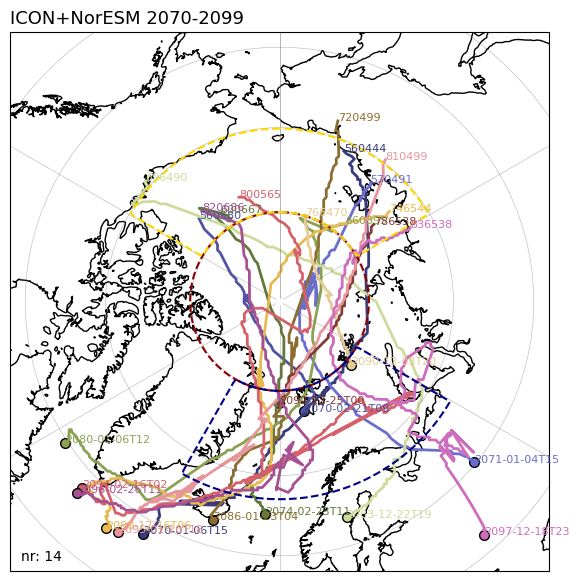

In [14]:
fig,ax=plt.subplots(1,1,subplot_kw={'projection': ccrs.Orthographic(0,90)},figsize=(7,7)) #    

objs_nr=len(objs_final)

for i in range(objs_nr):
    track=objs_final[i].track.values
    
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track])  

    if isinstance(df_objs, pd.DataFrame):
        obj_id=objs_final[i]['id_'].item()
        obj_color=df_objs[df_objs['id'] == obj_id].color.item()
        ax.text(track_lons[-1],track_lats[-1],obj_id,fontsize=8,\
                transform=crs_rot,color=obj_color,zorder=11)
        ax.text(track_lons[0],track_lats[0],str(objs_final[i]['times'][0].values.astype('datetime64[h]')),fontsize=8,\
                transform=crs_rot,color=obj_color,zorder=11)
        ax.scatter(track_lons[0],track_lats[0],facecolor=obj_color,edgecolor='k',transform=crs_rot)
        ax.plot(track_lons,track_lats,color=obj_color,transform=crs_rot) 

ax.coastlines()
ax.set_extent([-180,180, 58, 90], crs=ccrs.PlateCarree())
ax.gridlines(linewidth=0.5,color='dimgray',alpha=0.4,zorder=2)

for domain_name, domain_data in mask_domains.items():
    domain_data["mask"].plot.contour(levels=1,colors=domain_data["color"],linewidths=1.5,linestyles='--',zorder=4,ax=ax,transform=ccrs.PlateCarree())

ax.text(0.02,0.02,f'nr: {objs_nr}',transform=ax.transAxes,\
       bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

ax.set_title('ICON+NorESM 2070-2099',loc='left')

In [15]:
for i in range(len(objs_final)):
    track=objs_final[i].track.values
    
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track]) 
    print(str(objs_final[i]['times'][0].values.astype('datetime64[h]')))

2070-01-06T15
2070-02-21T09
2071-01-04T15
2074-02-23T11
2080-01-06T12
2083-12-22T19
2086-01-23T04
2088-12-16T06
2090-12-03T20
2092-12-25T00
2094-02-16T02
2095-01-10T18
2096-02-26T11
2097-12-18T23


# Plot Lifecycle Composites

### Functions

##### "Global variables"

In [20]:
#Land/lake mask
ds_land = xr.open_dataset('/work/aa0049/a271109/spice-v2.2/chain/work/polarres_wp3_cmip_CNRM_ssp370/post/yearly/FR_LAND/FR_LAND.ncz')
ds_lake = xr.open_dataset('/work/aa0049/a271109/spice-v2.2/chain/work/polarres_wp3_cmip_CNRM_ssp370/post/yearly/FR_LAKE/FR_LAKE.ncz')

In [21]:
#Sea level pressure
var='psl'
varname = 'psl'
ds = xr.open_mfdataset(f'{ICON_NorESM_path}/{var}/v20250601/{var}_*.nc',chunks = {'time':10})
ds_clim = xr.open_dataset(f'{ICON_clim_path}/clim/{var}/{var}_clim_day_DJF_ssp_15-39.nc',chunks={'time': 10})

#Select dataset and climatology for different domain times
var_NA, var_CA, var_BS, var_clim_NA, var_clim_CA, var_clim_BS = get_domain_values(ds[varname],ds_clim,NA_combined_times,
                                                                                 CA_combined_times, BS_combined_times)

#Compute anomalies
psl_NA_anom = var_NA - var_clim_NA[varname].mean(dim='time')
psl_CA_anom = var_CA - var_clim_CA[varname].mean(dim='time')
psl_BS_anom = var_BS - var_clim_BS[varname].mean(dim='time')


In [ ]:
#Sea Ice edge
ds_ice = xr.open_mfdataset('/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/ssp370/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/mon/siconca/v20250601/siconca_ARC-12_NorESM2-MM_ssp370_r1i1p1f1_CLMcom-AWI_ICON-CLM-202401-1-1_v1-r1_mon_*.nc',decode_times=False,chunks = {'time':10})


In [ ]:
# Replace this if time is a coordinate
months_since_1950 = ds_ice['time'].values
ds_ice['time'] = pd.date_range(start='2015-01-01', periods=len(months_since_1950), freq='MS')


In [ ]:
ds_ice = ds_ice.sel(time=slice("2070-01-01", "2099-12-01"))
siconc_mean = ds_ice.siconca.sel(time=ds_ice.siconca.time.dt.month.isin([12, 1, 2])).mean(dim='time') #Winter sea ice

sea_ice_edge = siconc_mean.where(((ds_land.FR_LAND+ds_lake.FR_LAKE)<0.85))


In [ ]:
sea_ice_edge.plot()

#### tas (T_2M)

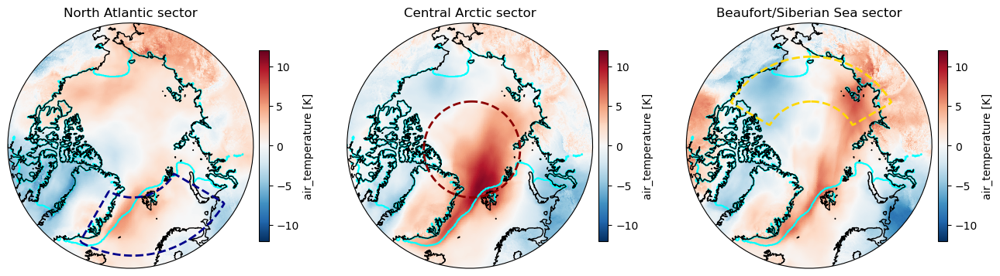

In [27]:
create_composites('tas','tas',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -12,12,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31",NESM=True)

#### pr (PREC_CON)

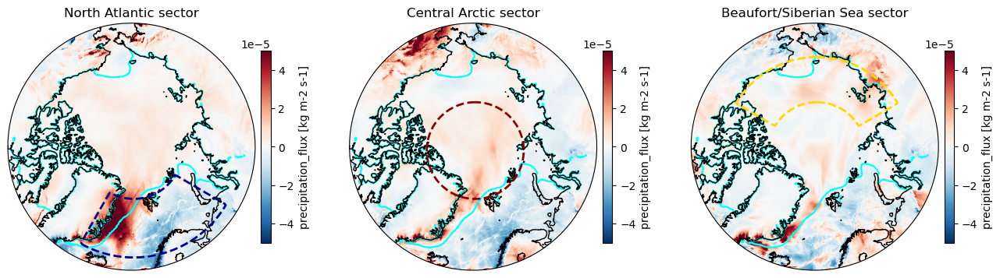

In [28]:
create_composites('pr','pr',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -0.00005,0.00005,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31",NESM=True)

#### rlds (ATHD_S)

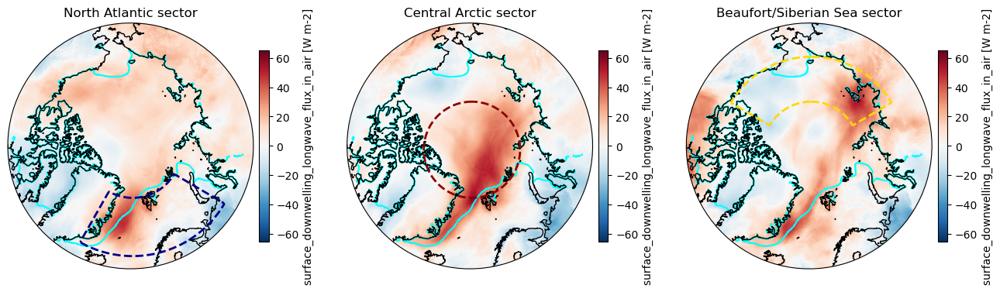

In [29]:
create_composites('rlds','rlds',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -65,65,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31",NESM=True)

#### hfls (ALHFL_S)

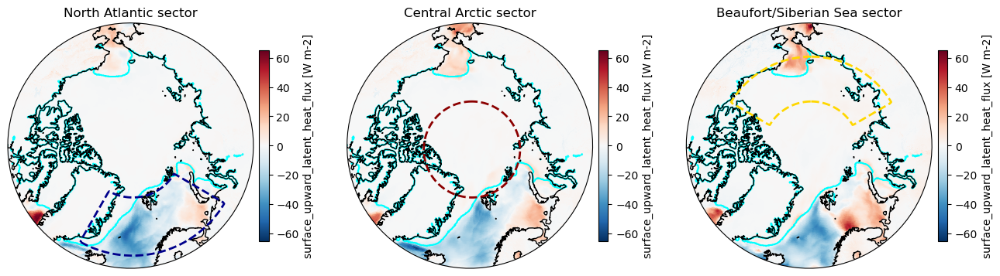

In [30]:
create_composites('hfls','hfls',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,-65,65,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31",NESM=True)

#### hfss (ASHFL_S)

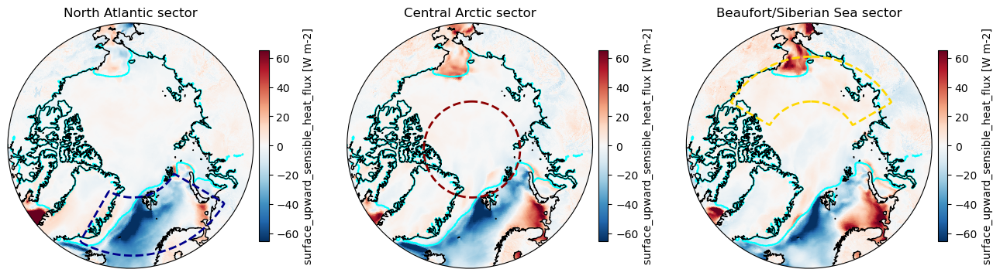

In [31]:
create_composites('hfss','hfss',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,-65,65,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31",NESM=True)

#### psl (PMSL)

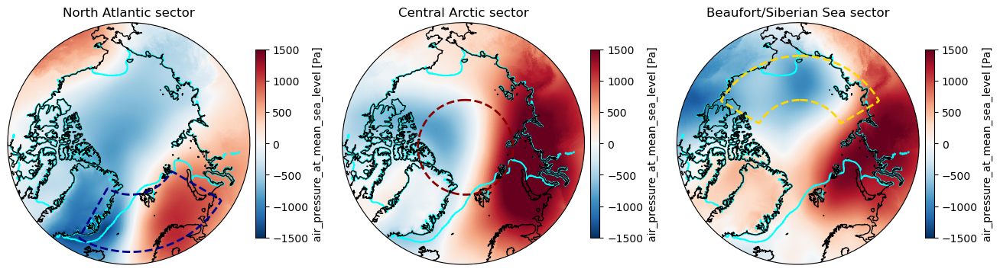

In [32]:
create_composites('psl','psl',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -1500,1500,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31",NESM=True)

#### prw (TQV)

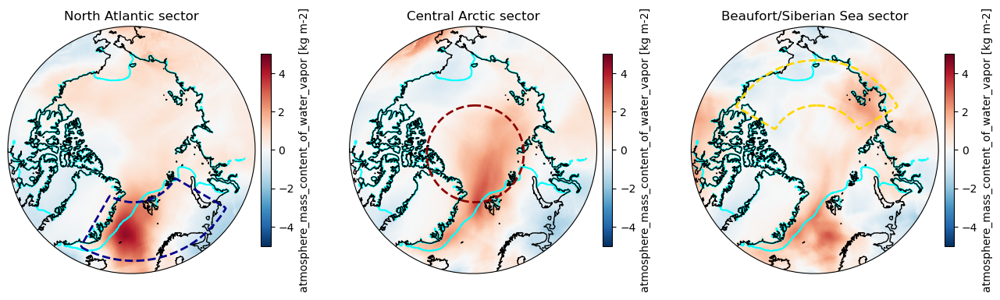

In [33]:
create_composites('prw','prw',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -5,5,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31",NESM=True)

#### sfcWind

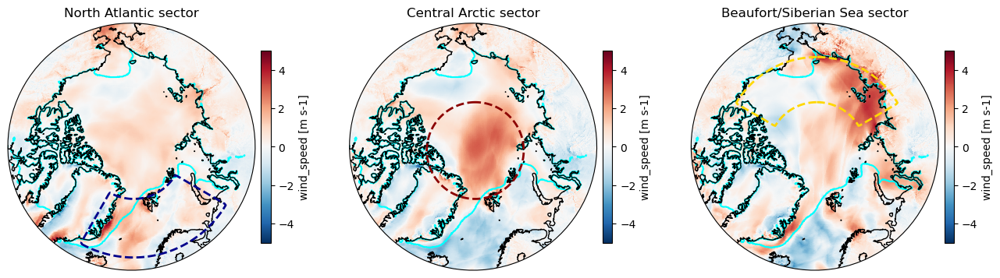

In [34]:
create_composites('sfcWind','sfcWind',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -5,5,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31",NESM=True)

#### clivi

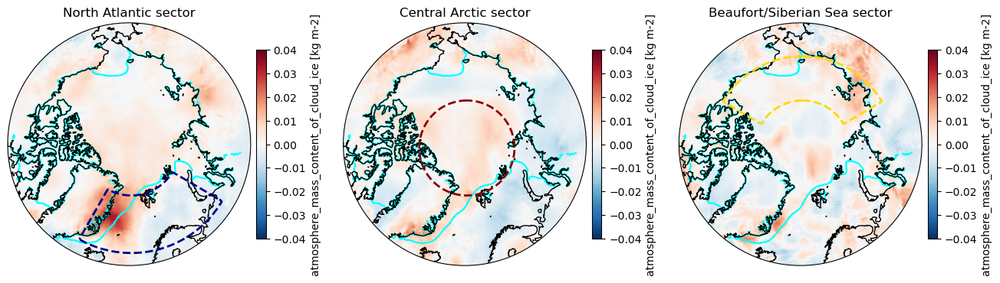

In [35]:
create_composites('clivi','clivi',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,
                  -0.04,0.04,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31",NESM=True)

#### clwvi

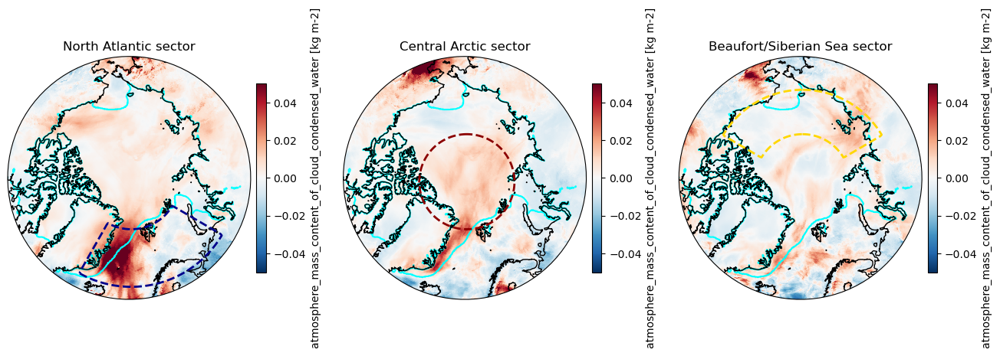

In [36]:
create_composites('clwvi','clwvi',
                  NA_combined_times,CA_combined_times,BS_combined_times,
                  psl_NA_anom,psl_CA_anom,psl_BS_anom,
                  ICON_NorESM_path,ICON_clim_path,
                  objs_final,
                  sea_ice_edge,-0.05,0.05,ssp=True,period='70-99',
                  startdate="2070-01-01", enddate="2099-12-31",NESM=True)

### Lifecycle MOAAP Objects

#### Functions

In [16]:
#Open moaap objects 
ds_moaap = xr.open_mfdataset('/work/aa0238/a271093/results/MOAAP/IVT_Tracking/NorESM_ssp_remapped_3x/ObjectMasks_MOAPP_ICON_100and85NorESMsspperc_remapped_3x_*_corrected.nc',chunks={'time': 10})

# Extract 2D latitude and longitude values
lat_tmp=ds_moaap.rlat.isel(x=0).values[0] #time=0,
lon_tmp=ds_moaap.rlon.isel(y=0).values[0] #time=0,

# Drop original variables and assign lat/lon as coordinates
ds_moaap=ds_moaap.drop(['rlat','rlon']).rename_dims({'y':'rlat','x':'rlon'}).assign_coords(rlat=lat_tmp,rlon=lon_tmp)

In [17]:
list_ids = [objs_final[i]['id_'].item() for i in range(len(objs_final))]

In [ ]:
list_ids

#### tas (T_2M)

In [27]:
tas_shape_list, tas_clim_list, tas_anomaly_list = create_and_store_lists('tas','tas','70-99',
                                                                         domains,ICON_NorESM_path,ICON_clim_path,
                                                                         objs_final,ds_moaap,ssp=True,
                                                                         startdate="2070-01-01", enddate="2099-12-31",NESM=True)

/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/ssp370/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/1hr/tas/v20250601/tas_*.nc


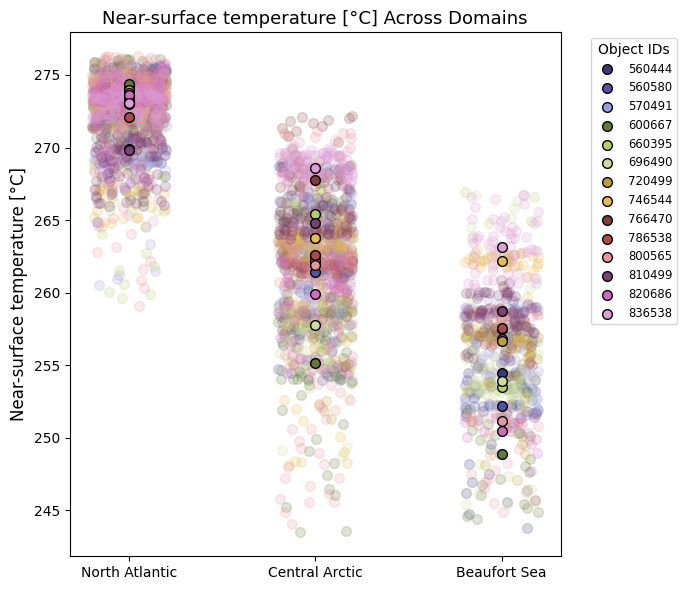

In [28]:
plot_scatter_domains(tas_shape_list[0], tas_shape_list[1], tas_shape_list[2], list_ids, f'Near-surface temperature [°C]',f'Near-surface temperature [°C] Across Domains', savefig = False)

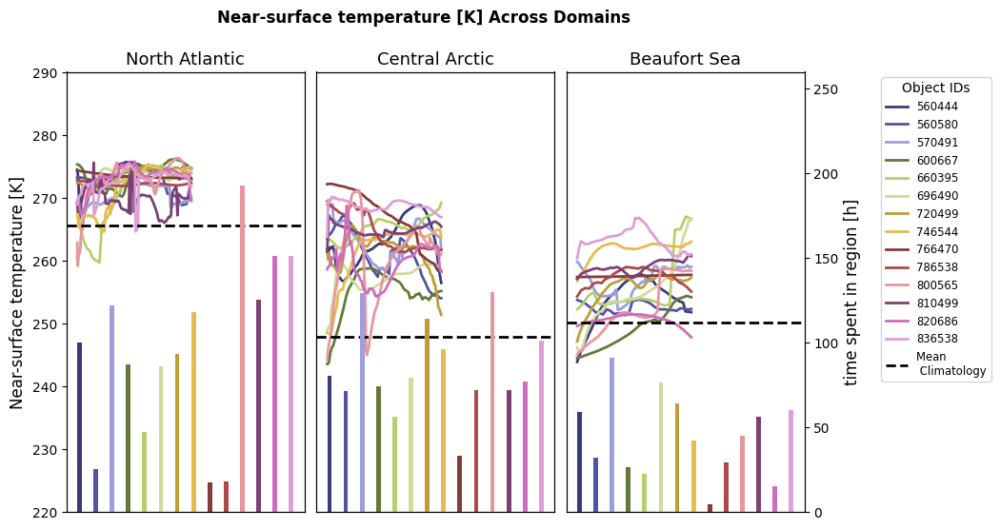

In [29]:
plot_masked_shapes_clim(tas_shape_list[0], tas_shape_list[1], tas_shape_list[2],
                                   tas_clim_list[0]['tas'].mean(dim=("rlat","rlon")),tas_clim_list[1]['tas'].mean(dim=("rlat","rlon")),tas_clim_list[2]['tas'].mean(dim=("rlat","rlon")),
                                   list_ids, f'Near-surface temperature [K]', f'Near-surface temperature [K] Across Domains',vmin=220,vmax=290, savefig = False,clim=True,bars=True)

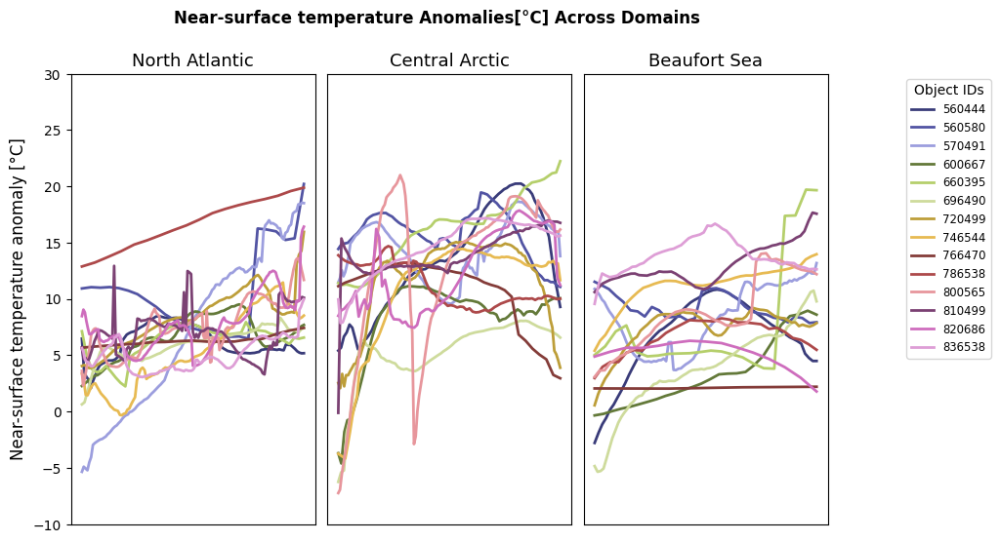

In [30]:
plot_masked_shapes_clim(tas_anomaly_list[0], tas_anomaly_list[1], tas_anomaly_list[2],
                                   tas_clim_list[0]['tas'].mean(dim=("rlat","rlon")),tas_clim_list[1]['tas'].mean(dim=("rlat","rlon")),tas_clim_list[2]['tas'].mean(dim=("rlat","rlon")),
                                   list_ids,f'Near-surface temperature anomaly [°C]', f'Near-surface temperature Anomalies[°C] Across Domains',vmin=-10,vmax=30,bars=False)

#### prw (TQV)

In [18]:
prw_shape_list, prw_clim_list, prw_anomaly_list = create_and_store_lists('prw','prw','70-99',
                                                                         domains,
                                                                         ICON_NorESM_path,ICON_clim_path,
                                                                         objs_final,ds_moaap,
                                                                         ssp=True,
                                                                         startdate="2070-01-01", enddate="2099-12-31",NESM=True)

/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/ssp370/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/1hr/prw/v20250601/prw_*.nc


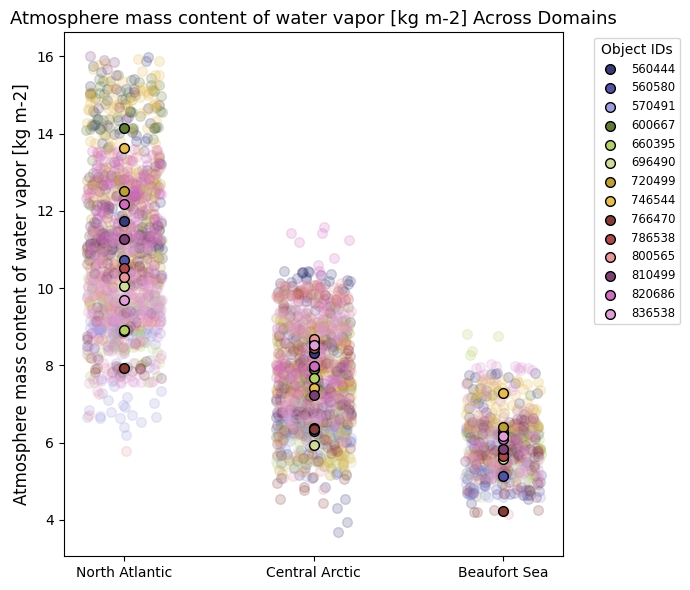

In [19]:
plot_scatter_domains(prw_shape_list[0], prw_shape_list[1], prw_shape_list[2], list_ids, f'Atmosphere mass content of water vapor [kg m-2]',f'Atmosphere mass content of water vapor [kg m-2] Across Domains', savefig = False)

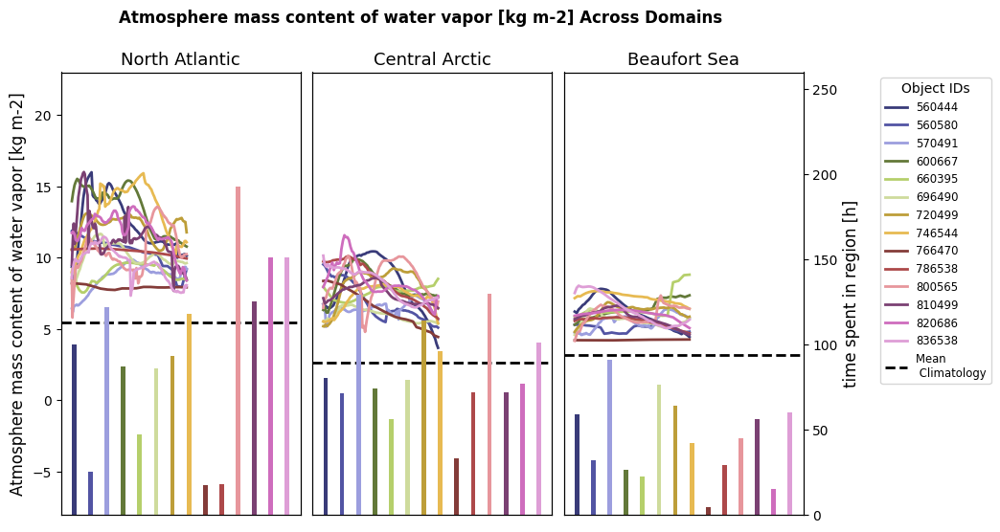

In [20]:
plot_masked_shapes_clim(prw_shape_list[0], prw_shape_list[1], prw_shape_list[2],
                                   prw_clim_list[0]['prw'].mean(dim=("rlat","rlon")),prw_clim_list[1]['prw'].mean(dim=("rlat","rlon")),prw_clim_list[2]['prw'].mean(dim=("rlat","rlon")),
                                   list_ids, f'Atmosphere mass content of water vapor [kg m-2]', f'Atmosphere mass content of water vapor [kg m-2] Across Domains',vmin=-8,vmax=23, savefig = False,clim=True,bars=True)

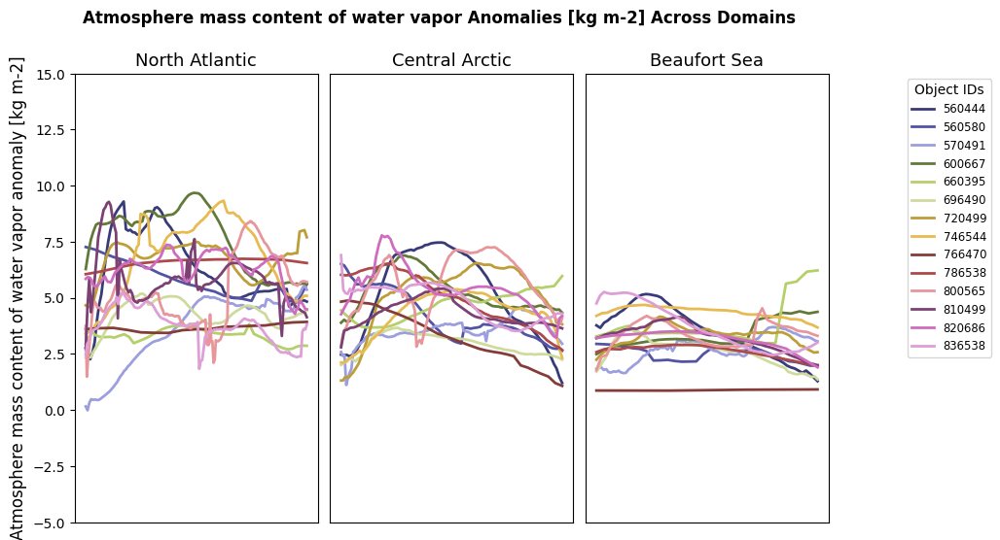

In [21]:
plot_masked_shapes_clim(prw_anomaly_list[0], prw_anomaly_list[1], prw_anomaly_list[2],
                                   prw_clim_list[0]['prw'].mean(dim=("rlat","rlon")),prw_clim_list[1]['prw'].mean(dim=("rlat","rlon")),prw_clim_list[2]['prw'].mean(dim=("rlat","rlon")),
                                   list_ids,f'Atmosphere mass content of water vapor anomaly [kg m-2]', f'Atmosphere mass content of water vapor Anomalies [kg m-2] Across Domains',vmin=-5,vmax=15,bars=False)

#### rlds (ATHD_S)

In [23]:
rlds_shape_list, rlds_clim_list, rlds_anomaly_list = create_and_store_lists('rlds','rlds','70-99',
                                                                         domains,ICON_NorESM_path,ICON_clim_path,
                                                                         objs_final,ds_moaap,ssp=True,
                                                                         startdate="2070-01-01", enddate="2099-12-31",NESM=True)

/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/ssp370/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/1hr/rlds/v20250601/rlds_*.nc


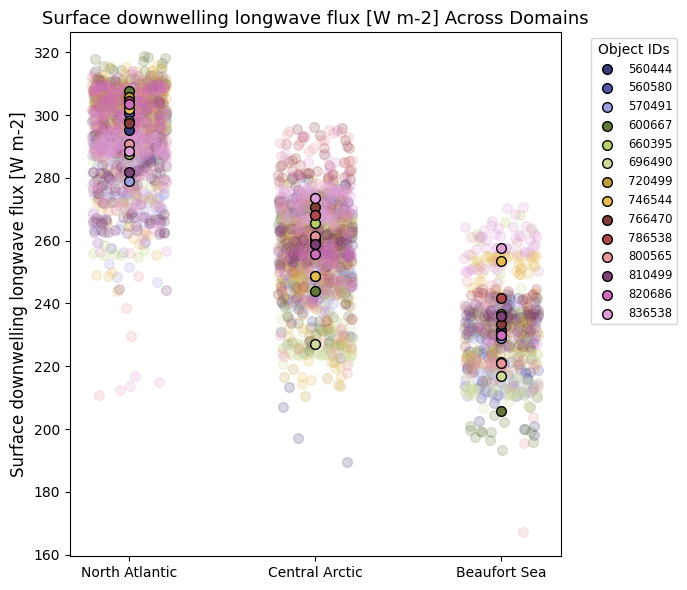

In [24]:
plot_scatter_domains(rlds_shape_list[0], rlds_shape_list[1], rlds_shape_list[2], list_ids, f'Surface downwelling longwave flux [W m-2]',f'Surface downwelling longwave flux [W m-2] Across Domains', savefig = False)

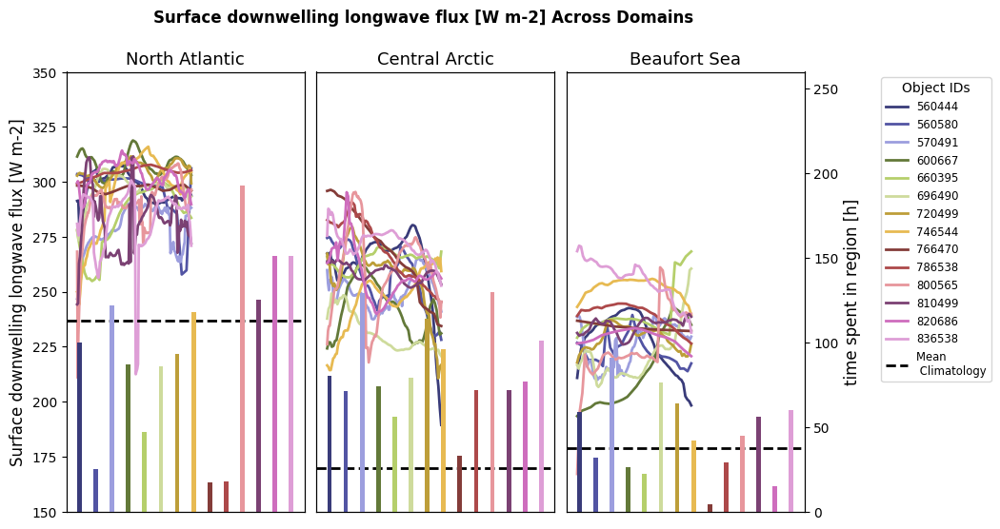

In [25]:
plot_masked_shapes_clim(rlds_shape_list[0], rlds_shape_list[1], rlds_shape_list[2],
                                   rlds_clim_list[0]['rlds'].mean(dim=("rlat","rlon")),rlds_clim_list[1]['rlds'].mean(dim=("rlat","rlon")),rlds_clim_list[2]['rlds'].mean(dim=("rlat","rlon")),
                                   list_ids, f'Surface downwelling longwave flux [W m-2]', f'Surface downwelling longwave flux [W m-2] Across Domains',vmin=150,vmax=350, savefig = False,clim=True,bars=True)

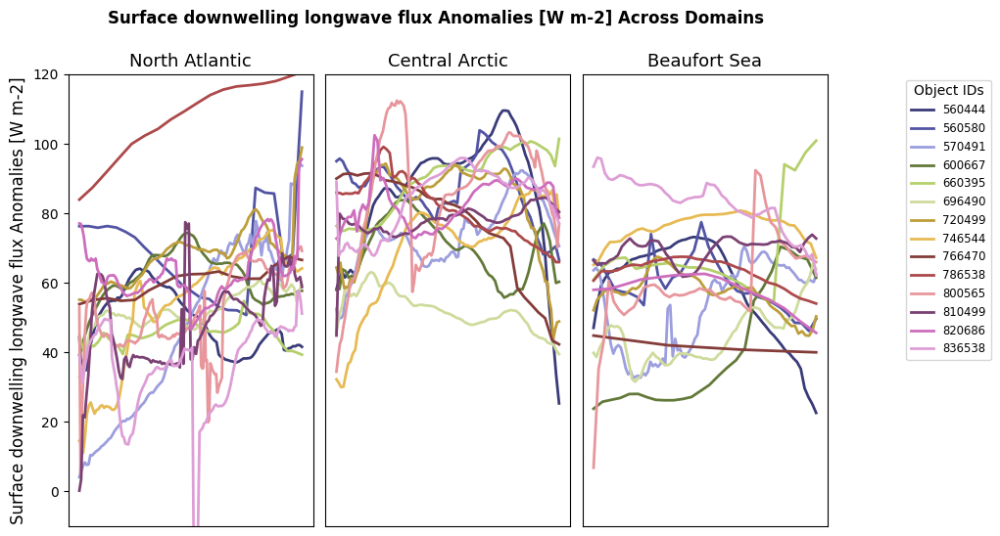

In [26]:
plot_masked_shapes_clim(rlds_anomaly_list[0], rlds_anomaly_list[1], rlds_anomaly_list[2],
                                   rlds_clim_list[0]['rlds'],rlds_clim_list[1]['rlds'],rlds_clim_list[2]['rlds'],
                                   list_ids,f'Surface downwelling longwave flux Anomalies [W m-2]', f'Surface downwelling longwave flux Anomalies [W m-2] Across Domains',vmin=-10,vmax=120,bars=False)

#### sfcWind

In [31]:
sfcWind_shape_list, sfcWind_clim_list, sfcWind_anomaly_list = create_and_store_lists('sfcWind','sfcWind','70-99',
                                                                         domains,ICON_NorESM_path,ICON_clim_path,
                                                                         objs_final,ds_moaap,ssp=True,
                                                                         startdate="2070-01-01", enddate="2099-12-31",NESM=True)

/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/ssp370/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/1hr/sfcWind/v20250601/sfcWind_*.nc


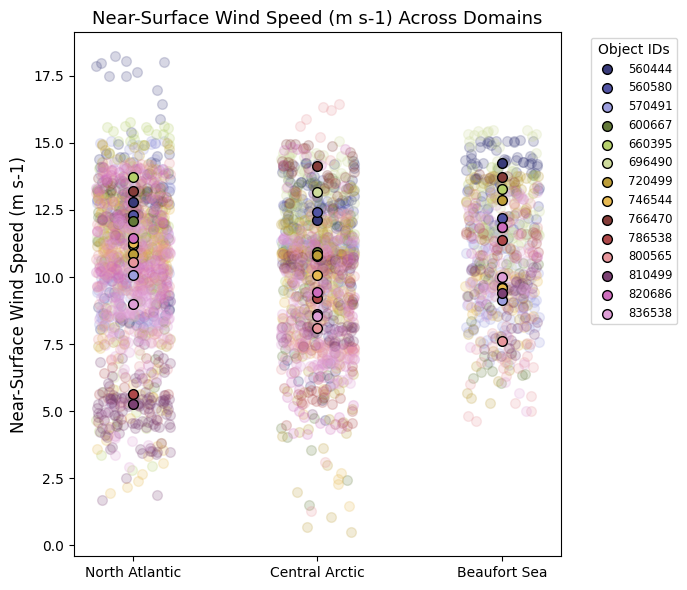

In [32]:
plot_scatter_domains(sfcWind_shape_list[0], sfcWind_shape_list[1], sfcWind_shape_list[2], list_ids, 
                     f'Near-Surface Wind Speed (m s-1)',f'Near-Surface Wind Speed (m s-1) Across Domains', savefig = False)

#### hfls

In [33]:
hfls_shape_list, hfls_clim_list, hfls_anomaly_list = create_and_store_lists('hfls','hfls','70-99',
                                                                            domains,ICON_NorESM_path,ICON_clim_path,
                                                                            objs_final,ds_moaap,
                                                                            ssp=True,
                                                                            startdate="2070-01-01", enddate="2099-12-31",NESM=True)

/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/ssp370/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/1hr/hfls/v20250601/hfls_*.nc


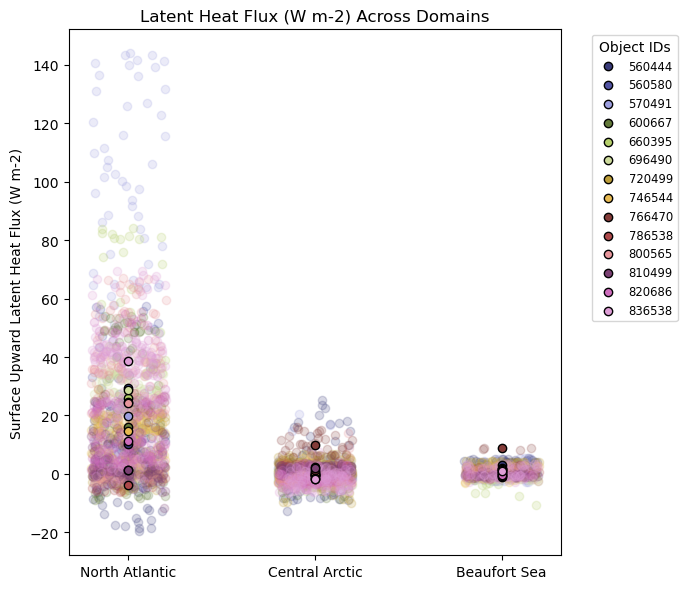

In [49]:
plot_scatter_domains(hfls_shape_list[0], hfls_shape_list[1], hfls_shape_list[2], list_ids,
                     f'Surface Upward Latent Heat Flux (W m-2)',f'Latent Heat Flux (W m-2) Across Domains', savefig = False)

#### hfss

In [34]:
hfss_shape_list, hfss_clim_list, hfss_anomaly_list = create_and_store_lists('hfss','hfss','70-99',
                                                                            domains,ICON_NorESM_path,ICON_clim_path,
                                                                            objs_final,ds_moaap,
                                                                            ssp=True,
                                                                            startdate="2070-01-01", enddate="2099-12-31",NESM=True)

/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/ssp370/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/1hr/hfss/v20250601/hfss_*.nc


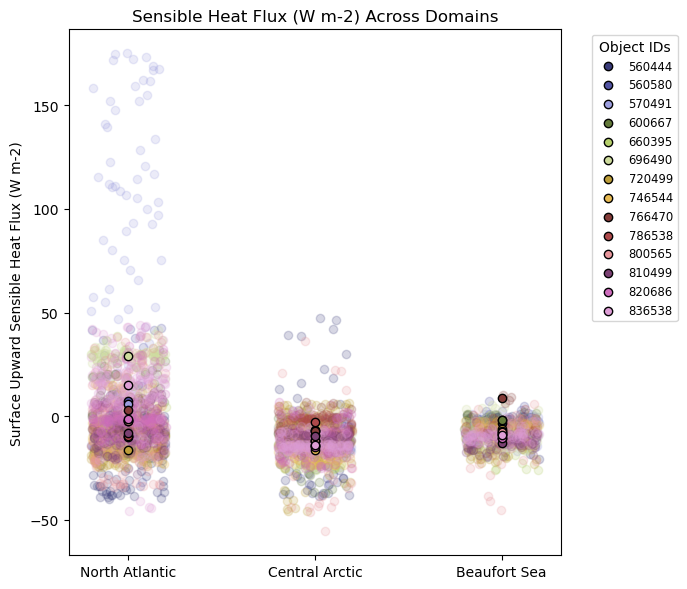

In [51]:
plot_scatter_domains(hfss_shape_list[0], hfss_shape_list[1], hfss_shape_list[2], list_ids, 
                     f'Surface Upward Sensible Heat Flux (W m-2)',f'Sensible Heat Flux (W m-2) Across Domains', savefig = False)

#### pr 

In [35]:
pr_shape_list, pr_clim_list, pr_anomaly_list = create_and_store_lists('pr','pr','70-99',
                                                                      domains,ICON_NorESM_path,ICON_clim_path,
                                                                      objs_final,ds_moaap,
                                                                      ssp=True,
                                                                      startdate="2070-01-01", enddate="2099-12-31",NESM=True)

/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/ssp370/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/1hr/pr/v20250601/pr_*.nc


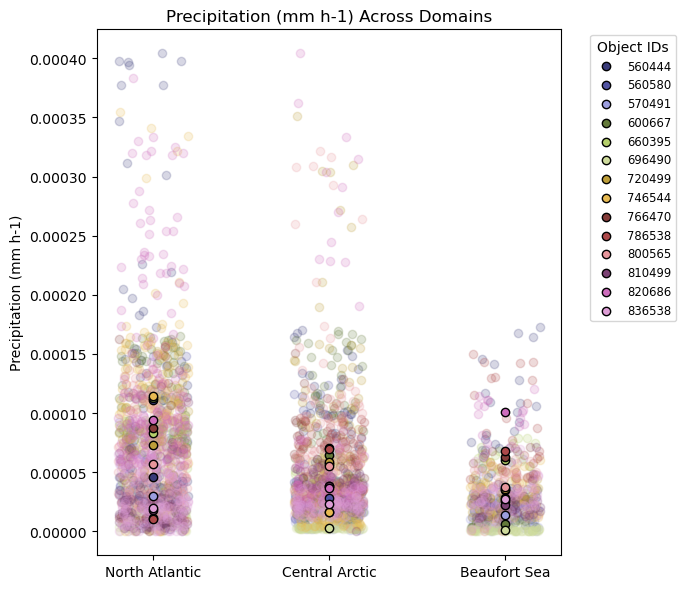

In [53]:
plot_scatter_domains(pr_shape_list[0], pr_shape_list[1], pr_shape_list[2], list_ids, 
                     f'Precipitation (mm h-1)',f'Precipitation (mm h-1) Across Domains', savefig = False)

#### clwvi

In [36]:
clwvi_shape_list, clwvi_clim_list, clwvi_anomaly_list = create_and_store_lists('clwvi','clwvi','70-99',
                                                                               domains,ICON_NorESM_path,ICON_clim_path,
                                                                               objs_final,ds_moaap,
                                                                               ssp=True,
                                                                               startdate="2070-01-01", enddate="2099-12-31",NESM=True)

/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/ssp370/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/1hr/clwvi/v20250601/clwvi_*.nc


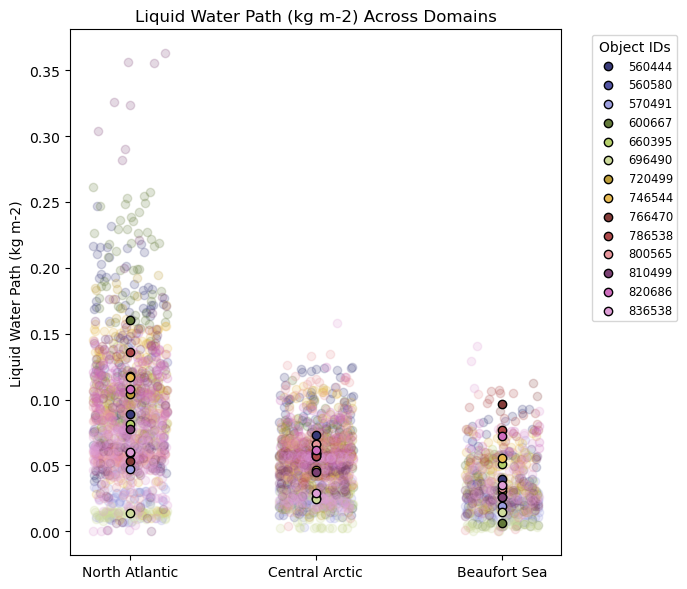

In [55]:
plot_scatter_domains(clwvi_shape_list[0], clwvi_shape_list[1], clwvi_shape_list[2], list_ids, 
                     f'Liquid Water Path (kg m-2)',f'Liquid Water Path (kg m-2) Across Domains', savefig = False)

#### clivi

In [ ]:
clivi_shape_list, clivi_clim_list, clivi_anomaly_list = create_and_store_lists('clivi','clivi',
                                                                               '70-99',domains,
                                                                               ICON_NorESM_path,ICON_clim_path,
                                                                               objs_final,ds_moaap,ssp=True,
                                                                               startdate="2070-01-01", enddate="2099-12-31",NESM=True)

/work/aa0049/a271041/CMOR/CORDEX-CMIP6/DD/ARC-12/CLMcom-AWI/NorESM2-MM/ssp370/r1i1p1f1/ICON-CLM-202401-1-1/v1-r1/1hr/clivi/v20250601/clivi_*.nc


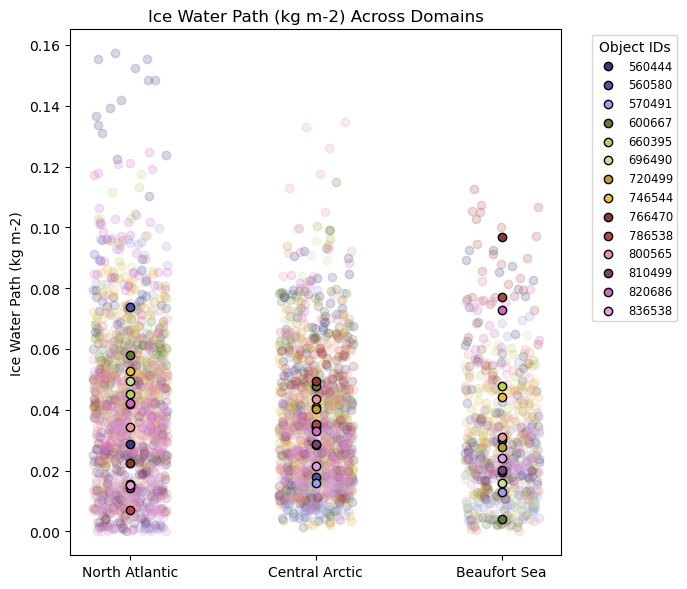

In [57]:
plot_scatter_domains(clivi_shape_list[0], clivi_shape_list[1], clivi_shape_list[2], list_ids, 
                     f'Ice Water Path (kg m-2)',f'Ice Water Path (kg m-2) Across Domains', savefig = False)

### Animations

In [27]:
def add_custom_colorbar(mappable, ax, ds, var_):

    standard_name = ds[var_].attrs.get('standard_name', var_)
    units = ds[var_].attrs.get('units', '')
    cbar = plt.colorbar(mappable, ax=ax, orientation='vertical', pad=0.08, shrink=0.8, extend='both')
    cbar.set_label(f'{var_} [{units}]', fontsize=12)
    cbar.ax.tick_params(labelsize=12)

In [32]:

def plot_subplot_anomalies(tt, variables, variable_names, variable_cmaps, ds_moaap, df_objs, objs, objs_plot_ids, crs_rot, mask_domains=None,savefig=False):
    """
    Create a 2x3 subplot of IVT and other variables at time `tt`.

    Parameters:
        tt: datetime-like object
        variables: list of 6 variable folder names (first one should be 'IVT')
        variable_names: list of 6 variable data names in the NetCDF files
        variable_cmaps: list of 6 colormaps for plotting
        enddate: string, end date for loading variable files
        ds_moaap: main dataset with IVT and object tracking
        df_objs: dataframe with object info (id, color)
        objs: list of object data (with track, speed, etc.)
        objs_plot_ids: list of object ids to highlight
        crs_rot: rotated pole CRS
        mask_domains: dict of domains with masks and colors (optional)
    """
    fig, axs = plt.subplots(2, 3, figsize=(18, 10),
                            subplot_kw={'projection': ccrs.Orthographic(0, 90)})
    axs = axs.flatten()


    vmin_vmax_dict = {
        'psl': (-1500, 1500),
        'tas': (-12, 12),
        'pr': (-0.1, 0.1),
        'tcc': (-20, 20),
        'hcc': (-20, 20),
        'mcc': (-20, 20),
        'lcc': (-20, 20),
        'rlds':(-65, 65),
        'hfls':(-65, 65),
        'hfss':(-65, 65),
        'sic': (0, 100)
    }

    for i in range(6):
        ax = axs[i]
        ax.clear()
        ax.set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
        ax.gridlines(linestyle='--', zorder=3)
        ax.coastlines(zorder=2)
        ax.add_feature(cartopy.feature.LAND, color='lightgray', alpha=1, zorder=0, edgecolor='black')
        ax.add_feature(cartopy.feature.OCEAN, color='white', zorder=0, edgecolor='black')
        fig.suptitle(f'Transarctic WAIs (IVT Objects) and large-scale features for ICON-CNRM SSP3.70 DJF | {pd.to_datetime(tt.values)}',fontweight='bold',y=0.97) #,ha='right' 
        
        # Clip to circle
        center, radius = [0.5, 0.5], 0.55
        circle = mpath.Path(np.vstack([np.sin(np.linspace(0, 2*np.pi, 100)),
                                       np.cos(np.linspace(0, 2*np.pi, 100))]).T * radius + center)
        ax.set_boundary(circle, transform=ax.transAxes)

        if i == 0:
            # Plot IVT
            ds_moaap_sel = ds_moaap.sel(time=tt, method='nearest').compute()
            ds_IVT = ds_moaap_sel.IVT.plot(x='rlon', y='rlat', ax=ax, vmin=0, vmax=250,
                cmap=variable_cmaps[i], transform=crs_rot,add_colorbar=False)

            cbar = plt.colorbar(ds_IVT, ax=ax, orientation='vertical', pad=0.08, shrink=0.8, extend='both')
            cbar.set_label('IVT [kg m-1 s-1]', fontsize=10)
            cbar.ax.tick_params(labelsize=10)
        else:
            # Plot climate variable
            var = variables[i]
            var_ = variable_names[i]

            # Default padding between colorbar and map
            vmin, vmax = vmin_vmax_dict.get(var, (None, None))
            
            ds = xr.open_mfdataset(f'{ICON_NorESM_path}{var}/{var}_*.nc',chunks = {'time':10})
            ds_clim = xr.open_dataset(f'{ICON_clim_path}/clim/{var}/{var}_clim_day_DJF_ssp_15-39.nc',chunks={'time': 10})

            #Compute anomaly
            tt_dt = pd.to_datetime(tt.values)
            month = tt_dt.month
            day = tt_dt.day
            month_day_str = f"{month:02d}-{day:02d}"
            
            
            var_tot = ds[var_].sel(time=tt, method='nearest')
            
            var_clim = ds_clim[var_].sel(time=ds_clim.time.dt.strftime('%m-%d') == month_day_str)
            
            var_anom = var_tot - var_clim

            var_anom_plot = var_anom.plot(ax=ax, cmap=variable_cmaps[i], transform=crs_rot,vmin=vmin,vmax=vmax,add_colorbar=False)

            add_custom_colorbar(var_anom_plot, ax, ds, var_)

        # Plot tracked objects
        ds_moaap_sel = ds_moaap.sel(time=tt, method='nearest').compute()
        obj_ids_tt = np.unique(ds_moaap_sel.IVT_Objects)
        obj_ids_tt = obj_ids_tt[obj_ids_tt != 0].astype(int)

        for obj_id in obj_ids_tt:
            if (df_objs['id'] == str(obj_id)).any():
                obj_color = df_objs[df_objs['id'] == str(obj_id)].color.item()
            else:
                obj_color = 'b'

            lw = 3 if str(obj_id) in objs_plot_ids else 1

            if str(obj_id) in objs_plot_ids:
                obj_idx = df_objs[df_objs['id'] == str(obj_id)].index.item()
                track = objs[obj_idx].track
                track_lats = np.array([x.lat for x in track.values])
                track_lons = np.array([x.lon for x in track.values])
                track_tt = track.sel(times=tt, method='nearest')
                ax.scatter(track_tt.item().lon, track_tt.item().lat, transform=crs_rot,
                           facecolor=[obj_color], edgecolor='k', s=20)
                
                # Ensure longitudes are in -180 to 180 range
                #track_lons = ((track_lons + 180) % 360) - 180

                ax.plot(track_lons, track_lats, color=obj_color, lw=0.75, transform=crs_rot, zorder=15) #track
                ax.text(track_lons[-1], track_lats[-1], obj_id, transform=crs_rot, color=obj_color, zorder=11)

            (ds_moaap_sel.IVT_Objects == obj_id).plot.contour(x='rlon', y='rlat', ax=ax, levels=1,
                                                              colors=[obj_color], linewidths=lw,
                                                              transform=crs_rot, zorder=5)

        #Add sea ice
        sea_ice_edge.plot.contour(levels=1, ax = ax, transform = crs_rot, colors = 'cyan', linewidths = 1, linestyles = '-',zorder=1)


        # Optional domain outlines
        if mask_domains:
            for domain_name, domain_data in mask_domains.items():
                domain_data["mask"].plot.contour(levels=1, colors=domain_data["color"],
                                                 linewidths=1.5, linestyles='--',
                                                 zorder=4, ax=ax, transform=ccrs.PlateCarree())

        if i == 0: 
            ax.set_title("IVT", y=1.05)
        else: 
            ax.set_title(f"{variables[i]} Anomalies", y=1.05)

    if savefig==True:
        path_input_images='ICON_NorESM/'
        path_movies='/work/aa0049/a271122/scripts/movies/'
        plt.savefig(path_movies + path_input_images + f"Comp_{pd.to_datetime(tt.values).strftime('%Y-%m-%dT%H-%M')}.jpg",dpi=300)#,transparent=True)
        plt.close(fig)
        
    #plt.tight_layout()
    #plt.show()


In [ ]:
for i in range(len(objs_final)):
    for t in objs_final[i].times:
        if t.dt.month == 3:
            print(str(i)+": MARCH")
            break


In [35]:
for i in range(len(objs_final)):
    track=objs_final[i].track.values
    
    track_lats = np.array([x.lat for x in track])
    track_lons = np.array([x.lon for x in track]) 
    print(str(objs_final[i]['times'][0].values.astype('datetime64[h]')))

2028-01-03T11
2031-02-07T16
2034-02-09T01
2036-12-11T15
2036-12-17T05


In [36]:
for i in range(len(objs_final):
    objs_plot_ids = [objs_final[i]['id_'].item()]#['1220835'] # ids_sel # ['1220826','1220835'] #['1030505','1036731']  # list of selected object IDs
    # MOSAiC 2020-04 cases: ['1220826','1220835']
    
    objs_plot_times = xr.concat(
        [obj.times for obj in objs_final if obj.id_.item() in objs_plot_ids],
        dim='times').sortby('times').drop_duplicates(dim='times')
    
    for tt in objs_plot_times[::6]:
        plot_subplot_anomalies(
            tt,
            variables=['IVT', 'psl','tas', 'rlds', 'hfls', 'hfss'],
            variable_names=['IVT', 'psl', 'tas', 'rlds', 'hfls', 'hfss'],
            variable_cmaps=['Blues', 'RdBu_r', 'RdBu_r', 'RdBu_r', 'RdBu_r', 'RdBu_r'],
            ds_moaap=ds_moaap,
            df_objs=df_objs,
            objs=objs_final,
            objs_plot_ids=objs_plot_ids,
            crs_rot=crs_rot,
            mask_domains=mask_domains,
            savefig = True
        )

In [98]:
#Load MOAAP shapes for all event timesteps
i=3
domain = "BeaufortSiberianSea"

moaap_sel = ds_moaap.sel(time=objs_final[i].times, method='nearest')
mask = (moaap_sel.IVT_Objects == int(objs_final[i].id_.item()))

#Load variable data for the same timesteps
data_sel = ds_tas.tas.sel(time=objs_final[i].times, method='nearest')

# Align mask with data grid
aligned_mask = mask.astype(int).interp(rlat=data_sel.rlat, rlon=data_sel.rlon, method="nearest")
aligned_mask = aligned_mask > 0

# Apply the mask on the variable data
filtered_data = data_sel.where(aligned_mask)
filtered_data = filtered_data.assign_coords(lon=filtered_data.lon)# + 180) % 360) - 180)


if domain == "BeaufortSiberianSea":
        # Apply domain mask
    filtered_domain = filtered_data.where(
                    ((filtered_data.lat >= mask_domains[domain]["south"]) & (filtered_data.lat <= mask_domains[domain]["north"])) &  ((filtered_data.lon >= mask_domains[domain]["east"]) & (filtered_data.lon <= 180)) |  ((filtered_data.lat >= mask_domains[domain]["south"]) & (filtered_data.lat <= mask_domains[domain]["north"])) & ((filtered_data.lon >= -180) & (filtered_data.lon <= mask_domains[domain]["west"])))       
else: filtered_domain = filtered_data.where((filtered_data.lat>=mask_domains[domain]["south"]) & (filtered_data.lat<=mask_domains[domain]["north"]) & (filtered_data.lon>=mask_domains[domain]["west"]) & (filtered_data.lon<=mask_domains[domain]["east"]))

#Check if filtered_domain has at least min_valid_points
num_valid_points = filtered_domain.count()





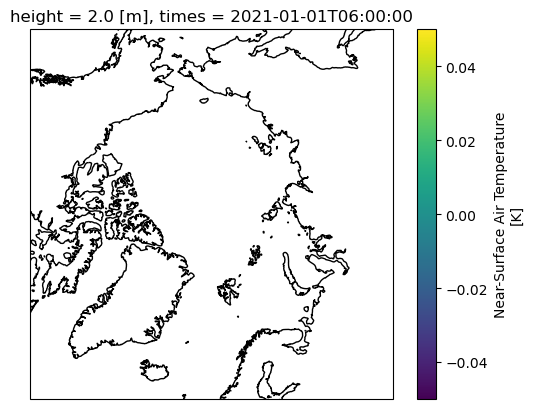

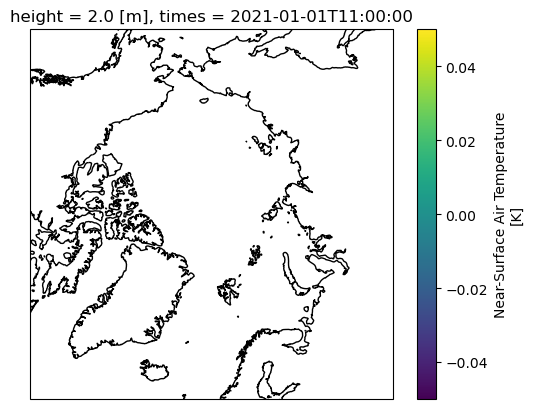

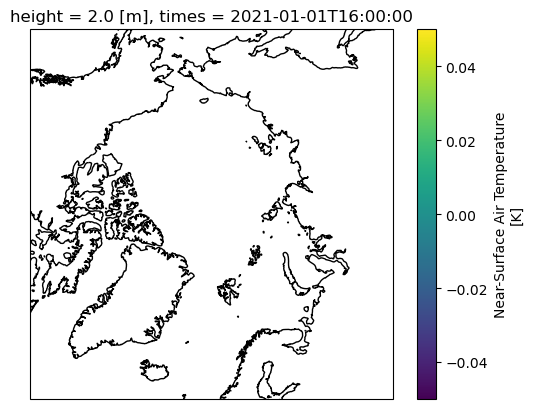

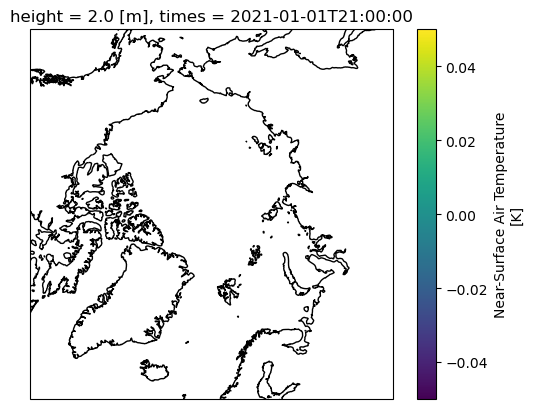

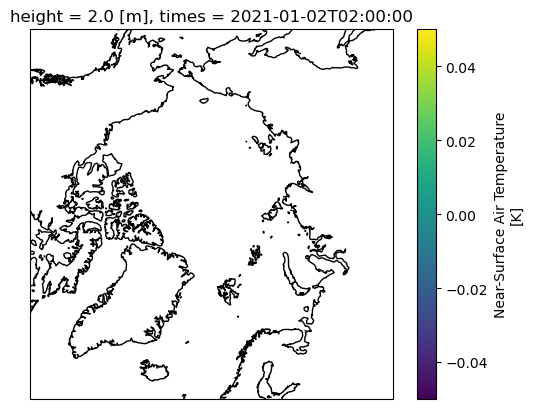

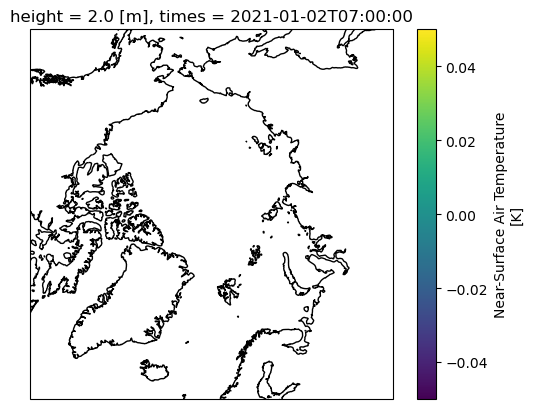

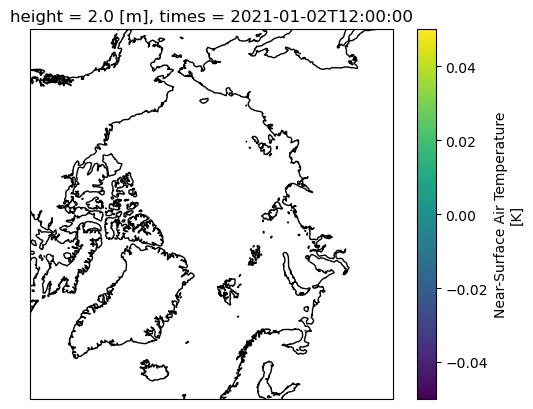

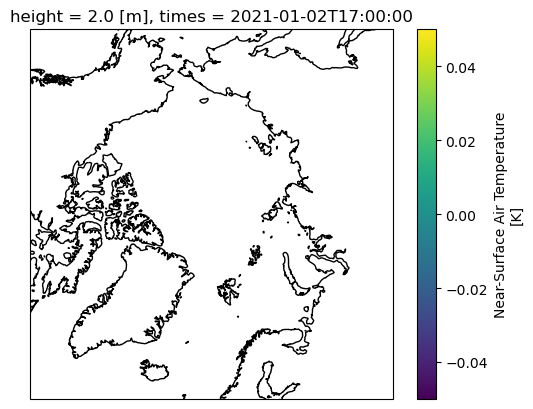

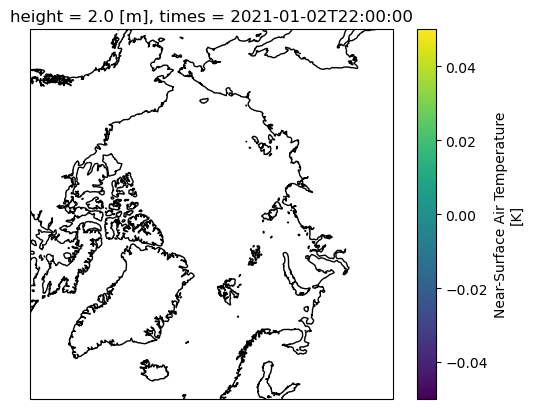

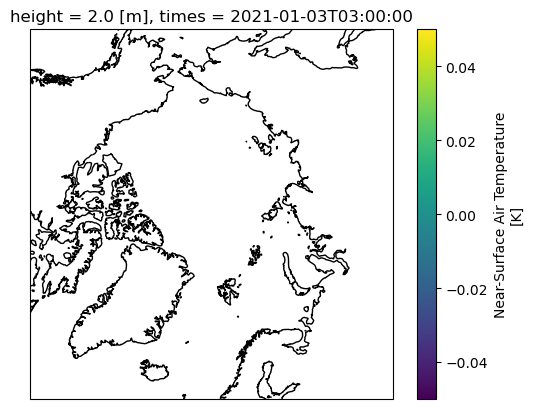

In [99]:
for i in range(40,90,5): 
    fig, ax = plt.subplots(1, 1,subplot_kw={'projection': ccrs.Orthographic(0,90)})
    filtered_data[i].plot(x='rlon',y='rlat', ax=ax, transform = crs_rot)
    #mask.plot.contour(x='rlon',y='rlat',ax=ax,levels=1,colors='k',linewidths=3,transform=crs_rot,zorder=10)
    ax.coastlines(zorder=2)

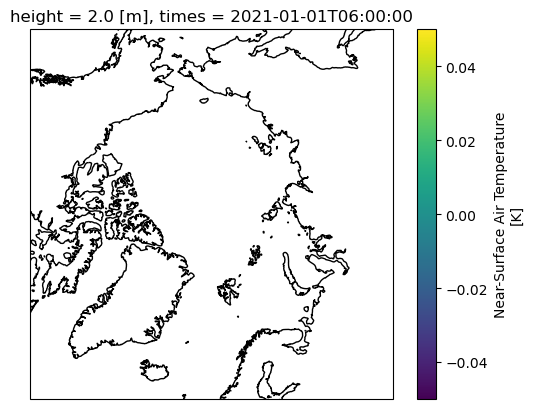

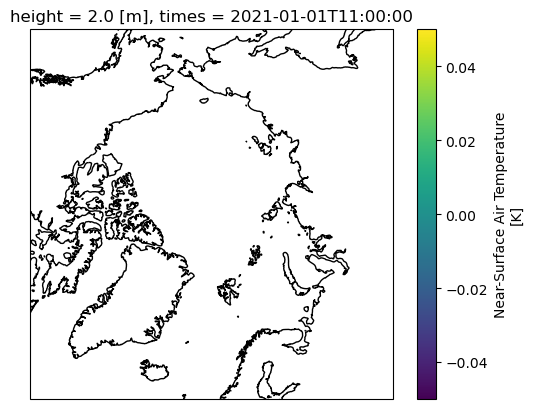

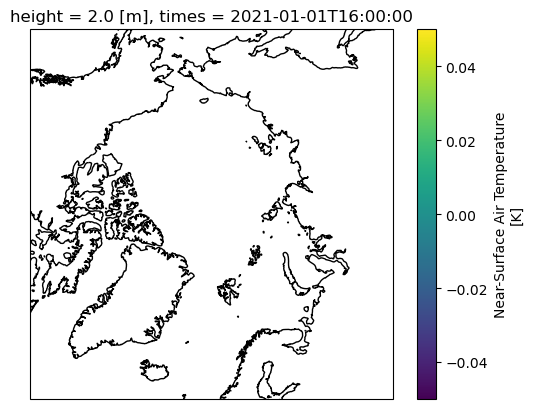

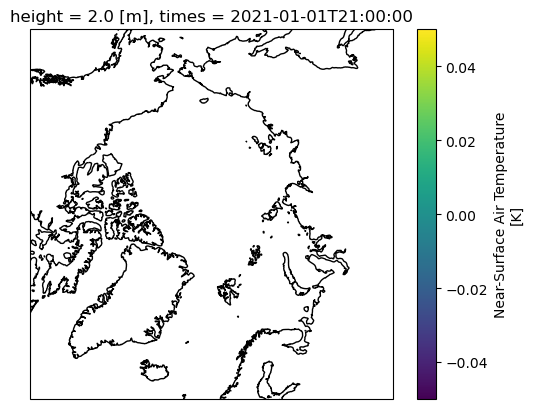

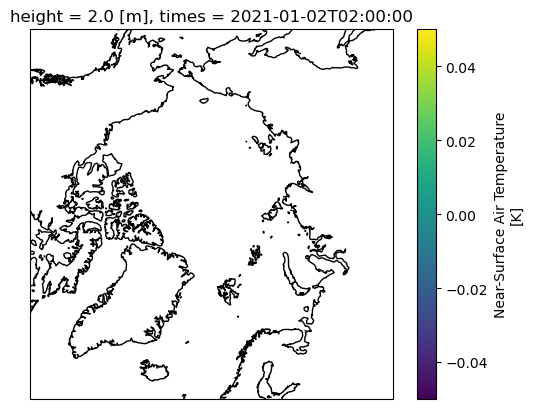

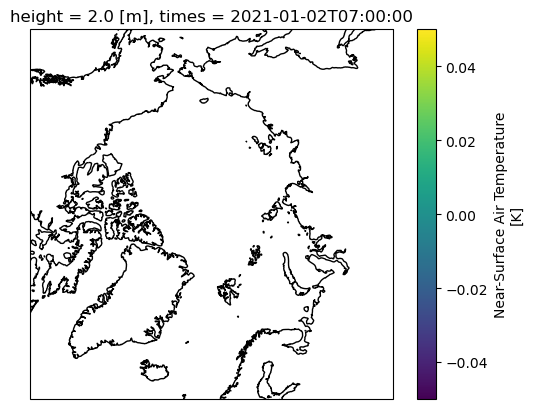

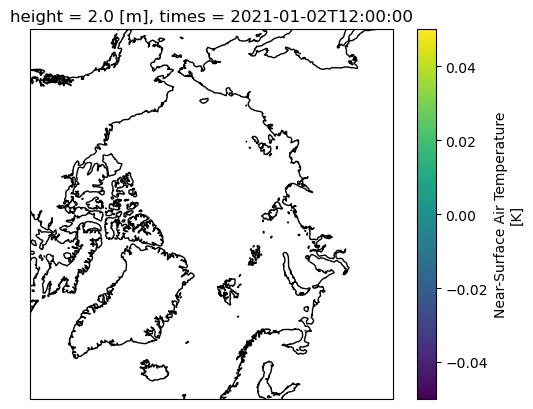

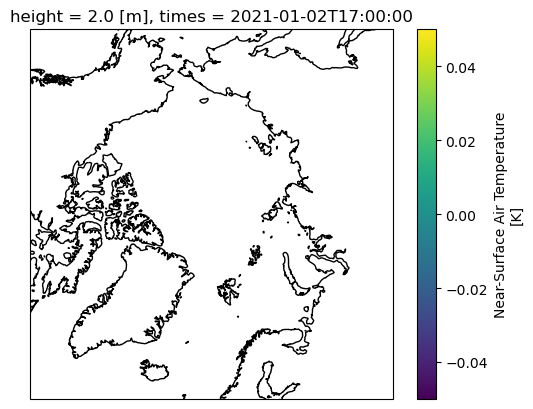

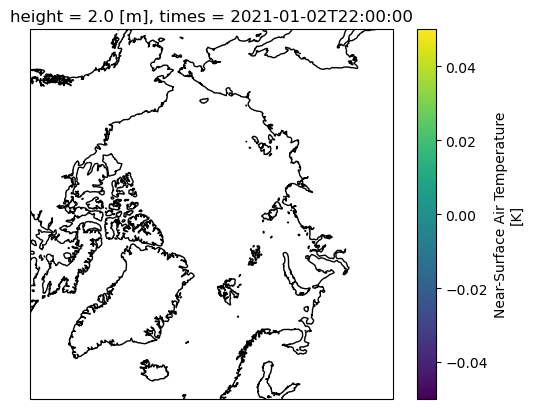

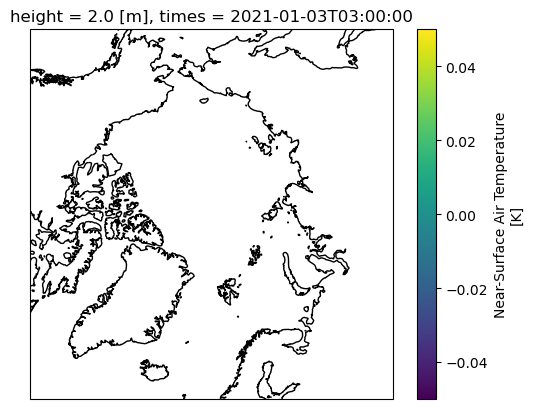

In [100]:
for i in range(40,90,5): 
    fig, ax = plt.subplots(1, 1,subplot_kw={'projection': ccrs.Orthographic(0,90)})
    filtered_domain[i].plot(x='rlon',y='rlat', ax=ax, transform = crs_rot)
    #mask.plot.contour(x='rlon',y='rlat',ax=ax,levels=1,colors='k',linewidths=3,transform=crs_rot,zorder=10)
    ax.coastlines(zorder=2)